### Loading packages

In [1]:
import sys
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl
from matplotlib_scalebar.scalebar import ScaleBar

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
import seaborn as sns

import os

## Function

In [2]:
# function from EmmaDann

def get_pixel_size_visium(adata, library_id, spot_diameter_real = 55, img='hires'):
    '''
    Utility function to get size of pixels from visium image in AnnData.
    Useful to plot scalebars with matplotlib_scalebar.ScaleBar
    
    Params:
    -------
    - adata: AnnData object storing image info in adata.uns[spatial]
    - library_id: string storing ID for image, must be a key in adata.uns[spatial]
    - spot_diameter_real: numeric storing real diameter of spot, in whatever unit you need 
        (default is 55, for 55 microns of Visium 10X spots)
    - img: which image to use
    '''

    ## get scale factor converting original pixel positions (adata.obsm['spatial']) to 
    # pixel positions in image
    scalef = adata.uns['spatial'][library_id]['scalefactors']['tissue_{i}_scalef'.format(i=img)]
    ## get spot diameter in image pixels
    spot_diameter_img = adata.uns['spatial'][library_id]['scalefactors']['spot_diameter_fullres'] * scalef
    ## Calculate pixel size
    pixel_size_real = spot_diameter_real/spot_diameter_img
    return(pixel_size_real)


In [3]:
# This function selects the data for multiple slides from the spatial anndata object.
# Modified `select_slide` in cell2loc for multiple slides

# @param adata: anndata object with multiple spatial experiments
# @param s: list of selected slides
# @param s_col: column in adata.obs listing experiment name for each location

def select_multislide(adata, s, s_col='sample'):

    slides = adata[adata.obs[s_col].isin(s), :]
    s_keys = list(slides.uns['spatial'].keys())
    
    uns_dict = {}
    for ss in s:
        s_spatial=np.array(s_keys)[[ss in k for k in s_keys]][0]
        uns_dict[s_spatial]=slides.uns['spatial'][s_spatial]
    
    slides.uns['spatial'] = uns_dict

    return slides

In [4]:
from scipy.spatial import distance_matrix
import warnings
from pandas.core.common import SettingWithCopyWarning

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

def annotate_celltype_niche(adata_vis,
                            celltype,
                            abundance_thresh,
                           n_spot_thresh,
                            slide=None,
                            slide_column='sample',
                           # cell2loc_resname='q05_cell_abundance_w_sf',
                           upper_limit_distance=2 ##### need improve #####
                           ):
    '''
    * adata_vis: with cell2location output in the obsm
    
    '''
    adata = adata_vis.copy()
    
    
    # check adata
    if 'q05_cell_abundance_w_sf' not in adata.obsm:
        if celltype not in adata.var_names:
            raise KeyError(f'invalid <adata_vis> or <cell2loc_out>')
    
    if celltype not in adata.var_names:
        # take obs data and cell2loc output
        obs = adata.obs.copy()
        cell2loc_res=adata.obsm['q05_cell_abundance_w_sf']
        cell2loc_res.columns=[x.replace('q05cell_abundance_w_sf_','') for x in cell2loc_res.columns]
        obs[cell2loc_res.columns]=cell2loc_res
    else:
        # this means 'celltype' is a feature in var_names (eg gene)
        obs = adata.obs.copy()
        gene_loc = adata_reg.var_names.get_loc(celltype)
        obs[celltype]=adata_reg.X[:,gene_loc].todense()
    
    # subset for each slide
    if slide!=None:
        obs = obs[obs[slide_column]==slide]
    
    # select relevant columns
    obs = obs[['array_row','array_col',slide_column,celltype]]
    
    # binarise the celltype abundance with abundance_thresh
    obs[f'{celltype}_bi']=obs[celltype]>abundance_thresh
    
    # subset celltype 'existing' spots
    obs_s=obs[obs[f'{celltype}_bi']]
    
    # distance matrix between spot pairs
    dm = distance_matrix(obs_s[['array_row','array_col']],obs_s[['array_row','array_col']])
    
    # count how many neighbors 
    dm = (dm <= upper_limit_distance)&(dm > 0) # define distance to neighbors (need improvement...)
    obs_s[f'{celltype}_n_neighbor'] = np.sum(dm,axis=0)
    
    # binarise the presence of niche based on the 'n_spot_thresh'
    ar = np.sum(dm,axis=0)>=(n_spot_thresh-1)
    for i in range(dm.shape[0]):
        if np.sum(np.sum(dm[ar],axis=0)>0)>np.sum(ar):
            ar = ar|(np.sum(dm[ar],axis=0)>0)
        else:
            print(f'iteration time: {i}')
            break
    obs_s[f'{celltype}_niche']=ar
    
    # make columns in adata
    '''
    if f'{celltype}_n_neighbor' not in adata.obs.columns:
        adata.obs[f'{celltype}_n_neighbor']=0
    if f'{celltype}_niche' not in adata_vis.obs.columns:
        adata.obs[f'{celltype}_niche']='0'
    '''
    adata.obs[f'{celltype}_n_neighbor']=0
    adata.obs[f'{celltype}_niche']='0'
    adata.obs.loc[obs_s.index,f'{celltype}_n_neighbor']=obs_s[f'{celltype}_n_neighbor']
    adata.obs.loc[obs_s.index,f'{celltype}_niche']=obs_s[f'{celltype}_niche'].astype('int').astype('str')
    adata.obs.loc[obs.index,f'{celltype}_abundance']=obs[celltype]
    
    return adata

## Read adata

In [7]:
adata_vis = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/visium-OCT_adult-8reg_raw.h5ad')
adata_vis

AnnData object with n_obs × n_vars = 55049 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL'
    uns: 'spatial'
    obsm: 'MT', 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [8]:
# filtering genes and log-normalise
sc.pp.filter_genes(adata_vis, min_cells=3)
sc.pp.normalize_total(adata_vis, target_sum=1e4)
sc.pp.log1p(adata_vis)

# add cell2loc output to .obs
df = adata_vis.obsm['q05_cell_abundance_w_sf'].copy()
df.columns = [x.replace('q05cell_abundance_w_sf_','') for x in df.columns]
adata_vis.obs[df.columns]=df.copy()

# var.names=SYMBOL
adata_vis.var.set_index('SYMBOL',inplace=True)
adata_vis

AnnData object with n_obs × n_vars = 55049 × 22055
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'Adip1', 'Adip2', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_act', 'CD4+T_naive', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_atria', 'EC8_ln', 'FB1', 'FB2', 'FB3', 'FB4', 'FB5', 'FB6', 'ILC', 'LYVE1+IGF1+MP', 'LYVE1+MP_cycling', 'LYVE1+TIMD4+MP', 'MAIT-like', 'Mast', 'MoMP', 'NC1', 'NC2', 'NK_CD16hi', 'NK_CD56hi', 'Neut', 'PC2_

In [9]:
# add proportion data: convert from abundance
df = adata_vis.obsm['q05_cell_abundance_w_sf'].copy()
df.columns=[x.replace('q05cell_abundance_w_sf_','') for x in df.columns]
df.columns = [f'prop_{x}' for x in df.columns]
prop_df = df.apply(lambda x:x/np.sum(x), axis=1)
adata_vis.obsm['prop']=prop_df.copy()
# add proportion values to the obs columns
adata_vis.obs[prop_df.columns] = prop_df.copy()

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/frame.py:3641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self[k1] = value[k2]


## Slide HCAHeartST8795938, Septum

In [10]:
slide = select_multislide(adata_vis, ['HCAHeartST8795938'], s_col='sample')

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Trying to set attribute `.uns` of view, copying.
... storing 'vCM3 * FB4_niche' as categorical


iteration time: 8


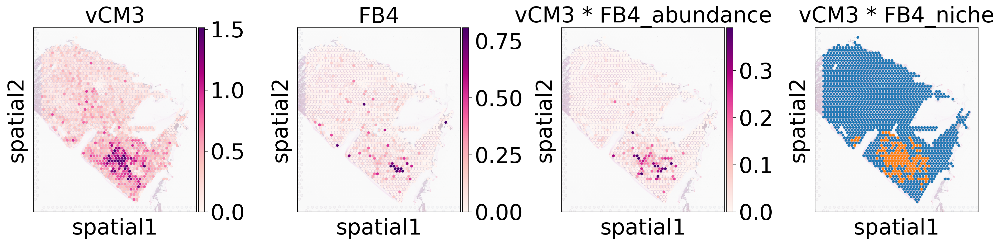

In [52]:
slide = select_multislide(adata_vis, ['HCAHeartST8795938'], s_col='sample')

# combine 'vCM3' and 'FB4'
slide.obsm['q05_cell_abundance_w_sf']['q05cell_abundance_w_sf_vCM3 * FB4']= \
slide.obsm['q05_cell_abundance_w_sf']['q05cell_abundance_w_sf_vCM3']*slide.obsm['q05_cell_abundance_w_sf']['q05cell_abundance_w_sf_FB4']

input_celltype = 'vCM3 * FB4'

slide = annotate_celltype_niche(slide,
                            celltype=input_celltype,
                            abundance_thresh=0.03,
                           n_spot_thresh=5,
                            slide_column='sample',
                           )

sc.set_figure_params(scanpy=True, fontsize=26, dpi=120)
sc.pl.spatial(slide,cmap='RdPu',
              color=[input_celltype.split(' * ')[0],input_celltype.split(' * ')[1],f'{input_celltype}_abundance',f'{input_celltype}_niche'], ncols=5, wspace=0.3,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.5',legend_loc=None,
             )

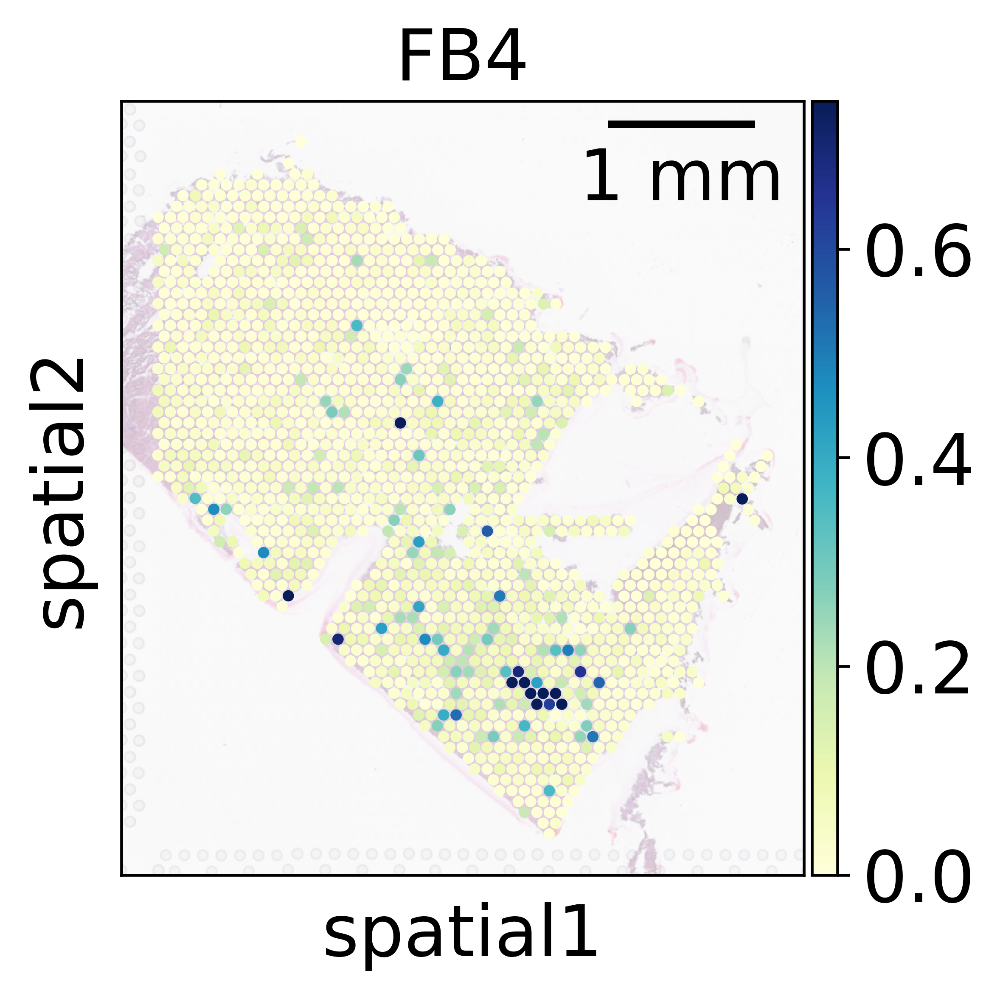

In [21]:
lib_id = [x for x in slide.uns['spatial'].keys()][0]
pix_size = get_pixel_size_visium(slide, lib_id)

# slide number
# n_slide=len(set(adata_oct.obs[adata_oct.obs['region_cell2loc']==reg]['sample']))

fig, ax = plt.subplots()
sc.set_figure_params(scanpy=True, fontsize=20, dpi=300)
sc.pl.spatial(slide,cmap='YlGnBu',
              color=['FB4'], 
              ncols=5, wspace=0,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.4', legend_loc=None, 
              show=False, ax=ax 
              # f'{reg}, {n_slide}slides'
             )

scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='upper right')
ax.add_artist(scalebar)

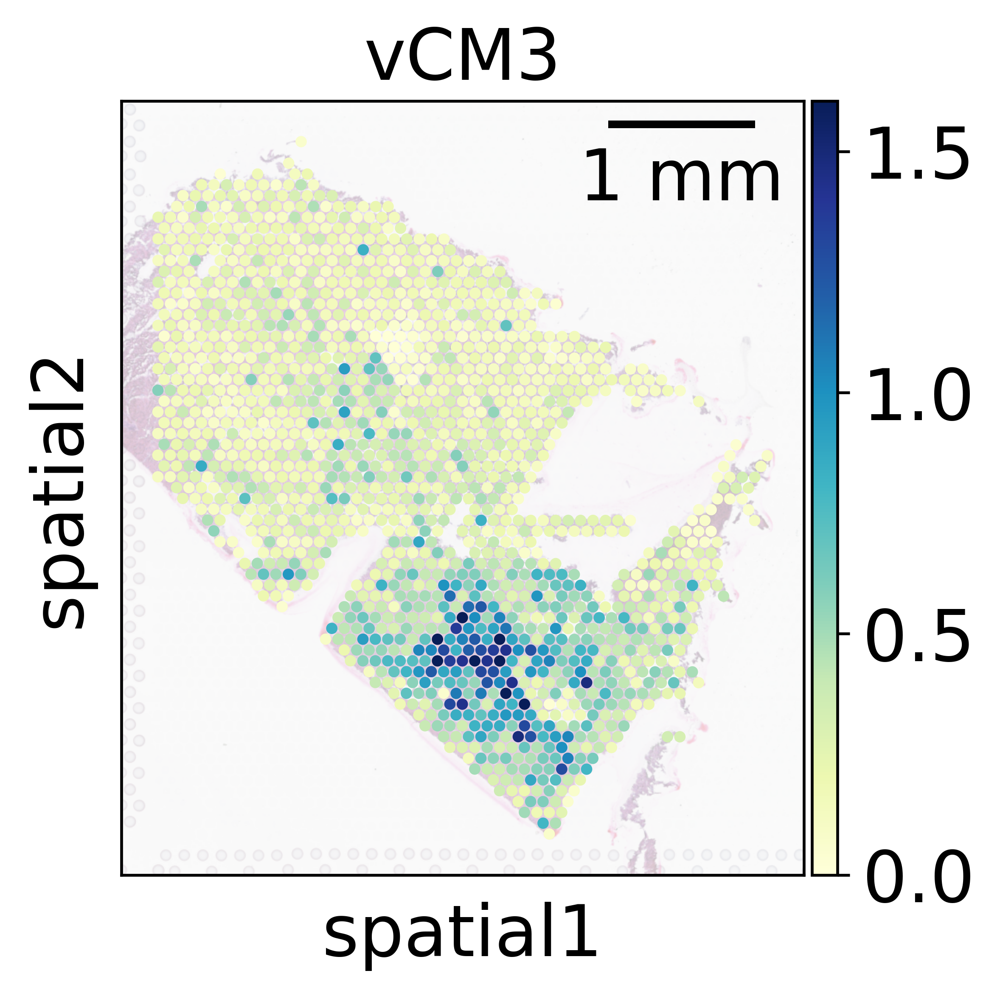

In [23]:
lib_id = [x for x in slide.uns['spatial'].keys()][0]
pix_size = get_pixel_size_visium(slide, lib_id)

# slide number
# n_slide=len(set(adata_oct.obs[adata_oct.obs['region_cell2loc']==reg]['sample']))

fig, ax = plt.subplots()
sc.set_figure_params(scanpy=True, fontsize=20, dpi=300)
sc.pl.spatial(slide,cmap='YlGnBu',
              color=['vCM3'], 
              ncols=5, wspace=0,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.6', legend_loc=None, 
              show=False, ax=ax 
              # f'{reg}, {n_slide}slides'
             )

scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='upper right')
ax.add_artist(scalebar)

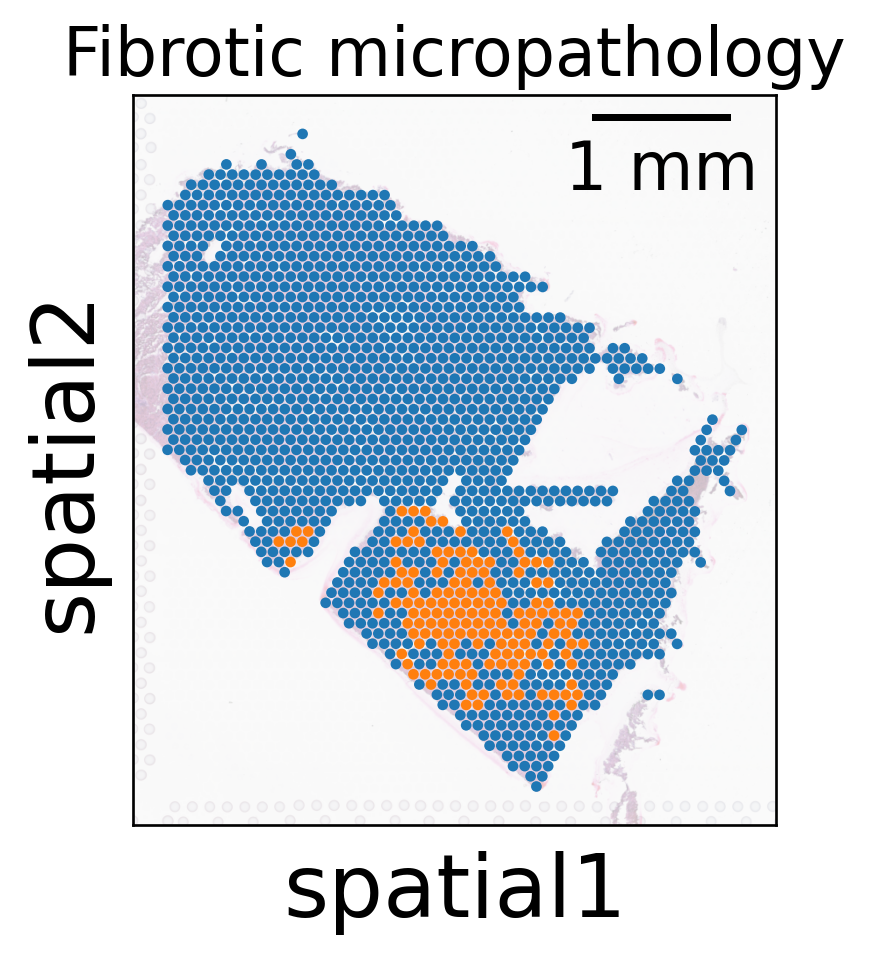

In [53]:
lib_id = [x for x in slide.uns['spatial'].keys()][0]
pix_size = get_pixel_size_visium(slide, lib_id)

# slide number
# n_slide=len(set(adata_oct.obs[adata_oct.obs['region_cell2loc']==reg]['sample']))

fig, ax = plt.subplots()
sc.set_figure_params(scanpy=True, fontsize=20, dpi=200)
sc.pl.spatial(slide,cmap='RdPu',
              color='vCM3 * FB4_niche', 
              ncols=5, wspace=0,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.4', legend_loc=None, 
              title='Fibrotic micropathology', show=False, ax=ax 
              # f'{reg}, {n_slide}slides'
             )

scalebar = ScaleBar(pix_size, "um", length_fraction=0.25, frameon=False, location='upper right')
ax.add_artist(scalebar)

In [146]:
slide.obs['vCM3 * FB4_niche'].value_counts()

0    1404
1     160
Name: vCM3 * FB4_niche, dtype: int64

## Select cell states exist in the niche

In [116]:
# Abundance
# abundance mean  # = mean of top 10% spots
abundance_mean_thresh=0.1

## calculate mean(abundance) in the niche 
df = slide.obsm['q05_cell_abundance_w_sf'].copy()
df.drop(['vCM3 * FB4'],axis=1,inplace=True)
df.columns=[x.replace('q05cell_abundance_w_sf_','') for x in df.columns]
df = df[slide.obs['vCM3 * FB4_niche']=='1']
df = df.mean()
# df = df.apply(lambda x:np.mean(x.nlargest(n=int(len(df)*0.1))))

## select cells larger than threshold
df = df[df>abundance_mean_thresh].sort_values(ascending=False)
print(df)

cells_abundance_sel=list(df.index)
cells_abundance_sel

vCM4             4.258269
T/NK_cycling     1.551401
vCM3             0.808944
FB5              0.595225
EC8_ln           0.464083
PC3_str          0.437235
EC5_art          0.382107
EC3_cap          0.346354
EC6_ven          0.250215
CD14+Mo          0.236422
SMC2_art         0.214073
FB4              0.212860
MoMP             0.204667
EC2_cap          0.169816
NK_CD16hi        0.155318
CD4+T_naive      0.152254
EC4_immune       0.144955
LYVE1+IGF1+MP    0.122871
vCM1             0.118435
vCM5             0.117518
FB3              0.107144
dtype: float64


['vCM4',
 'T/NK_cycling',
 'vCM3',
 'FB5',
 'EC8_ln',
 'PC3_str',
 'EC5_art',
 'EC3_cap',
 'EC6_ven',
 'CD14+Mo',
 'SMC2_art',
 'FB4',
 'MoMP',
 'EC2_cap',
 'NK_CD16hi',
 'CD4+T_naive',
 'EC4_immune',
 'LYVE1+IGF1+MP',
 'vCM1',
 'vCM5',
 'FB3']

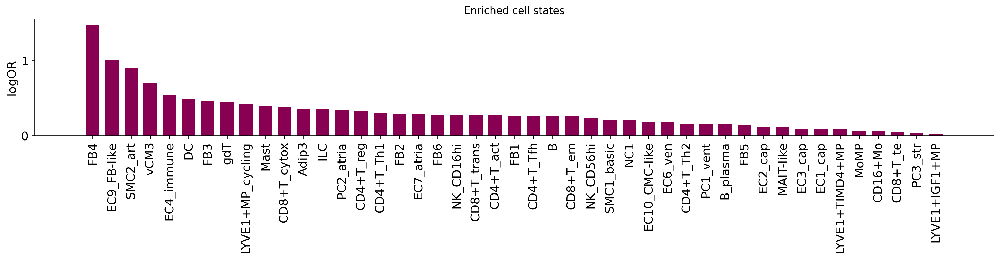

['FB4',
 'EC9_FB-like',
 'SMC2_art',
 'vCM3',
 'EC4_immune',
 'DC',
 'FB3',
 'gdT',
 'LYVE1+MP_cycling',
 'Mast',
 'CD8+T_cytox',
 'Adip3',
 'ILC',
 'PC2_atria',
 'CD4+T_reg',
 'CD4+T_Th1',
 'FB2',
 'EC7_atria',
 'FB6',
 'NK_CD16hi',
 'CD8+T_trans',
 'CD4+T_act',
 'FB1',
 'CD4+T_Tfh',
 'B',
 'CD8+T_em',
 'NK_CD56hi',
 'SMC1_basic',
 'NC1',
 'EC10_CMC-like',
 'EC6_ven',
 'CD4+T_Th2',
 'PC1_vent',
 'B_plasma',
 'FB5',
 'EC2_cap',
 'MAIT-like',
 'EC3_cap',
 'EC1_cap',
 'LYVE1+TIMD4+MP',
 'MoMP',
 'CD16+Mo',
 'CD8+T_te',
 'PC3_str',
 'LYVE1+IGF1+MP']

In [117]:
# specificity: odds ratio
logOR_thresh=0
roi='1'
category_name='vCM3 * FB4_niche'
errbar_significance=False

# remove prop-cellstates which doesn't exist in the region (SAN)
rm_list = [x for x in np.sum(slide.obs)[np.sum(slide.obs)==0].index if 'prop_' in x]
slide.obs.drop(rm_list, axis=1, inplace=True)

res=ROI_enrichment_allcomparison(slide,roi=roi,category_name=category_name)
res=res.sort_values('logOR',ascending=False)

# plotting
plt.rcParams["figure.dpi"] = 120
plt.rcParams['axes.grid'] = False
plt.figure(figsize=(20,2.5))

if errbar_significance:
    res=res[(res['p_adj']<p_adj_thresh)&(res['logOR']>0)]
    color = ['#870052' if x<p_adj_thresh else 'grey' for x in res['p_adj']]
    plt.bar(res['cell'], res['logOR'], yerr=res['ebar'], color=color,width=bar_width)
else:
    if logOR_thresh!=None:
        res=res[res['logOR']>logOR_thresh]
    else:
        res=res[res['logOR']>0]
    plt.bar(res['cell'], res['logOR'], color='#870052',width=bar_width)
        
plt.title('Enriched cell states', fontdict={'fontsize':12})
plt.ylabel('logOR',fontsize=14)
plt.xticks(rotation= 90,fontsize=14)
plt.yticks(fontsize=14)
plt.margins(x=0.06)
plt.show()

cells_OR_sel=list(res['cell'])
cells_OR_sel

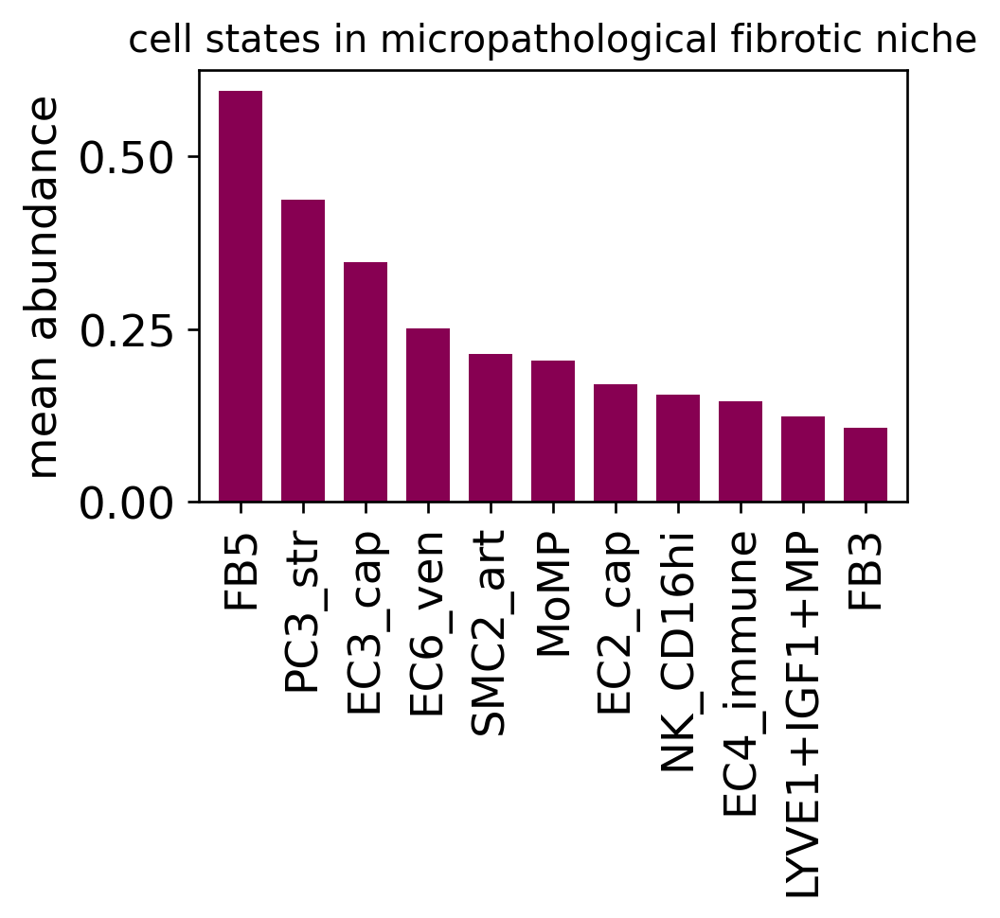

In [129]:
# intersection
cells_in_niche = [x for x in cells_abundance_sel if (x in cells_OR_sel)&(x not in ['FB4','vCM3'])]

## calculate mean(abundance) in the niche 
df = slide.obsm['q05_cell_abundance_w_sf'].copy()
df.drop(['vCM3 * FB4'],axis=1,inplace=True)
df.columns=[x.replace('q05cell_abundance_w_sf_','') for x in df.columns]
df = df[slide.obs['vCM3 * FB4_niche']=='1']
df = df.mean()
# df = df.apply(lambda x:np.mean(x.nlargest(n=int(len(df)*0.1))))

df = df[cells_in_niche]

plt.rcParams["figure.dpi"] = 120
plt.rcParams['axes.grid'] = False
plt.figure(figsize=(4,2.5))
plt.bar(df.index, df, color='#870052',width=0.7)
        
plt.title('cell states in micropathological fibrotic niche', fontdict={'fontsize':12})
plt.ylabel('mean abundance',fontsize=14)
plt.xticks(rotation= 90,fontsize=14)
plt.yticks(fontsize=14)
plt.margins(x=0.03)
plt.show()

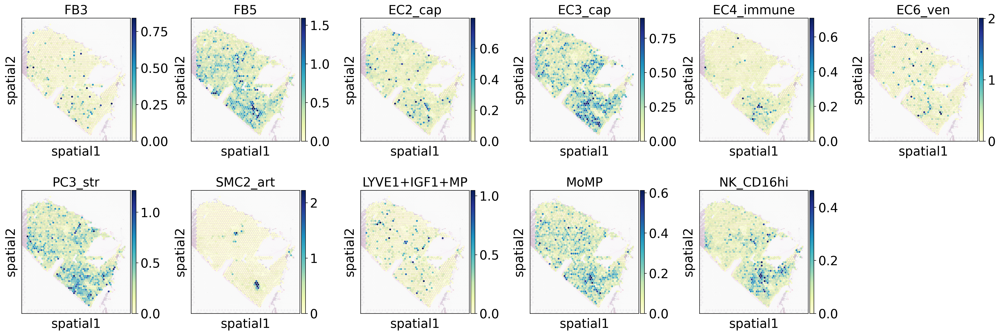

In [134]:
# reorder based of the cell type
cells_in_niche = ['FB3','FB5','EC2_cap','EC3_cap','EC4_immune','EC6_ven','PC3_str','SMC2_art','LYVE1+IGF1+MP','MoMP','NK_CD16hi',]

sc.pl.spatial(slide,cmap='YlGnBu',
              color=cells_in_niche, 
              ncols=6, wspace=0.15,hspace=0.4,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.7',legend_loc=None,
             )

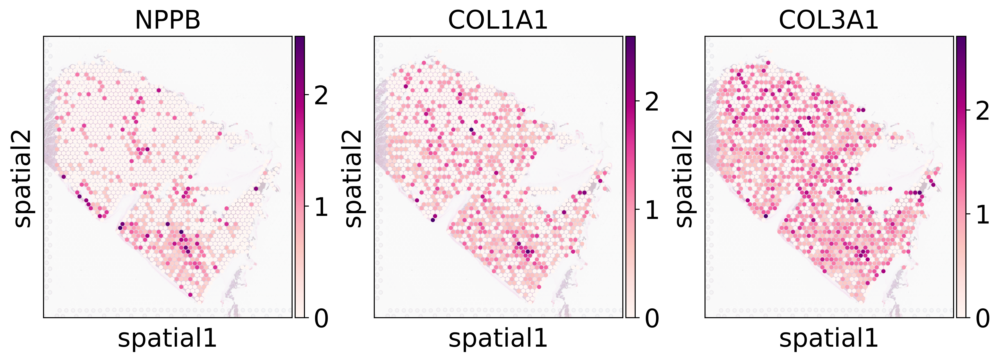

In [43]:
sc.pl.spatial(slide,cmap='RdPu',
              color=['NPPB','COL1A1','COL3A1'], 
              ncols=5, wspace=0.1,
              size=1.4,img_key='hires',alpha_img=0.3,vmin=0, vmax='p99.9',legend_loc=None,
             )